<a href="https://www.kaggle.com/code/ifeanyichukwunwobodo/analysis-of-the-bikeshare-network-in-sanfrancisco?scriptVersionId=135608007" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

<div style='color: #33332a;
           background-color: #FFFCC7;
           font-size: 200%;
           border-radius:15px;
           text-align:center;
           font-weight:600;
           border-style: solid;
           border-color: #33332a;
           font-family: "Cambria";'>
NETWORK ANALYSIS OF BIKESHARE IN SANFRANCISCO
<a class="anchor" id="1"></a> 

In [1]:
!wget http://bit.ly/3ZLyF82 -O CSS.css -q
    
from IPython.core.display import HTML
with open('./CSS.css', 'r') as file:
    custom_css = file.read()

HTML(custom_css)

# WHAT IS A NETWORK?


![web](https://cdn.pixabay.com/photo/2023/02/22/20/14/ai-generated-7807348_1280.jpg)

A network is a graph that shows how variables are related to each other. Network analysis is a powerful tool for understanding the structure and function of complex systems. It allows researchers to identify patterns and trends in the relationships between the entities in a network and to understand how these relationships influence the behavior of the system as a whole. Networks are used in the field of data science and analytics for analyzing:

* Social or communication networks

* Interbank lending relationships

* Asset price correlations

* Mobility of labor between firms

* Job referrals

* Supply chains
 
* Markets between buyers and sellers

* International trade

* Transportation systems (roads and intersections)

* Many other situations

Networks are also useful in machine learning, where they are used to describe the connections between neurons in neural architectures, and correlations between random variables in graphical models.

This notebook covers how to perform network analysis using the Bikeshare dataset. 

First the data is loaded, then basic SQL querying and exploratory data analysis is performed on the dataset in order to get insights from the dataset. Then we perform network anlytics to show how destination and origin are related and also to answer some key questions that the normal EDA will not enable us to answer. 

<div style='color: #33332a;
           background-color: #FFFCC7;
           font-size: 200%;
           border-radius:15px;
           text-align:center;
           font-weight:600;
           border-style: solid;
           border-color: #33332a;
           font-family: "Cambria";'>
RESEARCH QUESTIONS
<a class="anchor" id="1"></a> 

1. **Which region has the highest number of stations and available bikes?** 

2. **What is the distribution of trips per bike?** 

3. **What is the trend of trips?** 

4. **What is  the Station with the most number of trips?** 

5. **What is the spatial distribution of stations?** 

6. **What is the general distance preference by San Francisco Bikeshare Cyclists?** 

7. **Which station has the most importance?** 

8. **Accuracy of the Louvain Community Detection Method**

# PROBLEM STATEMENT



A bicycle-sharing system, bike share program, public bicycle scheme,or public bike share (PBS) scheme, is a shared transport service where bicycles are available for shared use by individuals at low cost.

The programmes themselves include both docking and dockless systems, where docking systems allow users to rent a bike from a dock, i.e., a technology-enabled bicycle rack and return at another node or dock within the system – and dockless systems, which offer a node-free system relying on smart technology. In either format, systems may incorporate smartphone web mapping to locate available bikes and docks. Most large-scale urban bike sharing programmes have numerous bike check-out stations, and operate much like public transit systems, catering to tourists and visitors as well as local residents.

People use bike-share for various reasons. Cost and time are primary motivators for using bike-sharing programs, in particular the perceived cost of travel and time saved traveling. Some who would otherwise use their own bicycle have concerns about theft or vandalism, parking or storage, and maintenance.

Bikeshares also serve as sustainable alternatives for short trip. Bikeshare provides free or affordable access to bicycles for short-distance trips in an urban area as an alternative to private vehicles, thereby reducing congestion, noise, and air pollution. According to research in 2016, the bike sharing system in Shanghai saved 8,358 tonnes of petrol and decreased carbon dioxide and NOx emissions by 25,240 and 64 tonnes, respectively. The research also stated that bike sharing system has great potential to reduce energy consumption and emissions based on its rapid development.


Bikeshare is great for stand-alone trips and is often the quickest, most affordable way to get around.  It’s also ideal as a first- and last-mile option for longer trips by transit. Bicycle-sharing systems have also been cited as a way to solve the "last mile" problem of public transit networks. However, dock systems, serving only stations, resemble public transit and have therefore been criticized as less convenient than a privately owned bicycle used door-to-door.



![img](https://media.wired.com/photos/5cef024155779866fb91b088/master/w_2560%2Cc_limit/Transpo_BikeShare_TA1-969820572.jpg)

Given the importance of bikeshare, this project seeks to provide variable insights on bikeshare trips with an emphasis on San Francisco.

# INSTALL DEPENDENCIES

In [2]:
!pip install -Uqq pyvis h3 


# IMPORT THE NECCESSARY LIBRARIES

In [3]:
from google.cloud import bigquery #For data retrieval and querying
import pandas as pd #for data manipulation and trandsformation
import numpy as np #for basic mathematics
 #for visualization 
import matplotlib.pyplot as plt
import matplotlib.cm as cm 
import seaborn as sns
import plotly.express as px
import h3
import networkx as nx
import community.community_louvain as cl
import plotly.io as pio
pio.templates.default = "ggplot2"
np.random.seed(42)

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# DATA RETRIEVAL

In [4]:
# Create a "Client" object
client = bigquery.Client()

# Construct a reference to the "san_francisco_bikeshare" dataset
dataset_ref = client.dataset("san_francisco_bikeshare", project="bigquery-public-data")

# API request - fetch the dataset
dataset = client.get_dataset(dataset_ref)

Using Kaggle's public dataset BigQuery integration.


In [5]:
def query_to_df(query):
    # transfers query results to pandas dataframe for easy manipulating
    return(client.query(query).result().to_dataframe())

def get_schema(table):
    # retreives the schema as a printed object
    return(client.get_table(table).schema)

**Note:** You can skip to the "Graph theory" heading  via the table of content if you are only interested in the Network analytics part.

# DATA SCHEMA

A data schema describes how tables are organized in a database showing the various fields in each table as well as other information about the fields and the table in general.

## Tables in the Database

In [6]:
# List all the tables in the  dataset
tables = list(client.list_tables(dataset))

# Print names of all tables in the dataset (there are four!)
for table in tables:  
    print(table.table_id)

bikeshare_regions
bikeshare_station_info
bikeshare_station_status
bikeshare_trips


In [7]:
#bikeshare_regions
table = 'bigquery-public-data.san_francisco_bikeshare.bikeshare_regions'
get_schema(table)

[SchemaField('region_id', 'INTEGER', 'REQUIRED', 'Unique identifier for the region', (), None),
 SchemaField('name', 'STRING', 'REQUIRED', 'Public name for this region', (), None)]

In [8]:
#bikeshare_station_status
table = 'bigquery-public-data.san_francisco_bikeshare.bikeshare_station_status'
get_schema(table)

[SchemaField('station_id', 'STRING', 'REQUIRED', 'Unique identifier of a station', (), None),
 SchemaField('num_bikes_available', 'INTEGER', 'REQUIRED', 'Number of bikes available for rental', (), None),
 SchemaField('num_bikes_disabled', 'INTEGER', 'NULLABLE', 'Number of disabled bikes at the station. Vendors who do not want to publicize the number of disabled bikes or docks in their system can opt to omit station capacity (in station_information), num_bikes_disabled and num_docks_disabled. If station capacity is published then broken docks/bikes can be inferred (though not specifically whether the decreased capacity is a broken bike or dock)', (), None),
 SchemaField('num_docks_available', 'INTEGER', 'REQUIRED', 'Number of docks accepting bike returns', (), None),
 SchemaField('num_docks_disabled', 'INTEGER', 'NULLABLE', 'Number of empty but disabled dock points at the station. This value remains as part of the spec as it is possibly useful during development', (), None),
 SchemaFiel

In [9]:
#bikeshare_station_info
table = 'bigquery-public-data.san_francisco_bikeshare.bikeshare_station_info'
get_schema(table)

[SchemaField('station_id', 'STRING', 'REQUIRED', 'Unique identifier of a station.', (), None),
 SchemaField('name', 'STRING', 'REQUIRED', 'Public name of the station', (), None),
 SchemaField('short_name', 'STRING', 'NULLABLE', 'Short name or other type of identifier, as used by the data publisher', (), None),
 SchemaField('lat', 'FLOAT', 'REQUIRED', 'The latitude of station. The field value must be a valid WGS 84 latitude in decimal degrees format. See: http://en.wikipedia.org/wiki/World_Geodetic_System, https://en.wikipedia.org/wiki/Decimal_degrees', (), None),
 SchemaField('lon', 'FLOAT', 'REQUIRED', 'The longitude of station. The field value must be a valid WGS 84 longitude in decimal degrees format. See: http://en.wikipedia.org/wiki/World_Geodetic_System, https://en.wikipedia.org/wiki/Decimal_degrees', (), None),
 SchemaField('region_id', 'INTEGER', 'NULLABLE', 'ID of the region where station is located', (), None),
 SchemaField('rental_methods', 'STRING', 'NULLABLE', 'Array of en

In [10]:
#bikeshare_trips
table = 'bigquery-public-data.san_francisco_bikeshare.bikeshare_trips'
get_schema(table)

[SchemaField('trip_id', 'STRING', 'REQUIRED', 'Numeric ID of bike trip', (), None),
 SchemaField('duration_sec', 'INTEGER', 'NULLABLE', 'Time of trip in seconds', (), None),
 SchemaField('start_date', 'TIMESTAMP', 'NULLABLE', 'Start date of trip with date and time, in PST', (), None),
 SchemaField('start_station_name', 'STRING', 'NULLABLE', 'Station name of start station', (), None),
 SchemaField('start_station_id', 'INTEGER', 'NULLABLE', 'Numeric reference for start station', (), None),
 SchemaField('end_date', 'TIMESTAMP', 'NULLABLE', 'End date of trip with date and time, in PST', (), None),
 SchemaField('end_station_name', 'STRING', 'NULLABLE', 'Station name for end station', (), None),
 SchemaField('end_station_id', 'INTEGER', 'NULLABLE', 'Numeric reference for end station', (), None),
 SchemaField('bike_number', 'INTEGER', 'NULLABLE', 'ID of bike used', (), None),
 SchemaField('zip_code', 'STRING', 'NULLABLE', 'Home zip code of subscriber (customers can choose to manually enter zi

# Which region has the highest number of stations and available bikes?

In [11]:
QUERY = (
    """
    SELECT
        CAST(si.region_id AS STRING) AS region_id, COUNT(si.station_id) AS num_of_stations, SUM(ss.num_bikes_available) AS num_bikes
    FROM
      `bigquery-public-data.san_francisco_bikeshare.bikeshare_station_info` AS si
    LEFT JOIN
        `bigquery-public-data.san_francisco_bikeshare.bikeshare_station_status` AS ss
    ON
        si.station_id=ss.station_id
    GROUP BY 
        region_id
    ORDER BY
        num_bikes DESC
    """)
region = query_to_df(QUERY)
region.style.format(na_rep="Unknown _id"
                       ).highlight_null(color='orange'
                                                     ).bar(align="mid", color='lightgreen')

,region_id,num_of_stations,num_bikes
0,3,266,3170
1,5,83,869
2,12,79,690
3,Unknown _id,41,525
4,14,37,182
5,13,11,88


From the table the regions with the highest number of bikes also have the highest number of stations. In short, there is a positive relationship between number of stations in a region and the number of bikes in the region. The region with region_id "3"has the highest number of bikes and the stations.

One of the region id is unknown (denoted by the orange highlight). This may be due to data entry error.

# What is the Distribution of Trips Per Bike?

In [12]:
QUERY = (
    """
    SELECT
        COUNT(trip_id) AS num_trips, bike_number 
    FROM
      `bigquery-public-data.san_francisco_bikeshare.bikeshare_trips`
    GROUP BY
      bike_number
    ORDER BY
      num_trips DESC
    """)


trips = query_to_df(QUERY)
px.histogram(trips,'num_trips',title='Distribution of Bikeshare Trips in San Francisco')


Although the number of trips per bikes are skewed to low values, there is a significant amount of bikes that have taken trips greter than 2000. Only a few bikes have been riden more than 1000 time with trips having a nigh zero count between 1000 and 15000. 

# What is the Trend of Trips?

In [13]:
QUERY = (
    """
    SELECT 
        COUNT(trip_id) as trips,
        EXTRACT(YEAR from start_date) as year,
    FROM
       `bigquery-public-data.san_francisco_bikeshare.bikeshare_trips`
    GROUP BY year
    ORDER BY year 
    """)
annual_trips = query_to_df(QUERY)
px.line(annual_trips,y='trips', x='year', title="Trend of Trips")


The number of trips increased between 2013 and 2014. The rate of increased slowed down betweeen 2014 and 2015 before a decline in 2016. In 2017, the number of trips peaked  before declining again in 2018.

# Which stations account for the most number of trips?



In [14]:
QUERY = (
    """
    SELECT 
        COUNT(trip_id) as trips,
        start_station_name as station,
        
    FROM
       `bigquery-public-data.san_francisco_bikeshare.bikeshare_trips`
    GROUP BY station
    ORDER BY trips DESC
    LIMIT 5
    """)
station_trips = query_to_df(QUERY)
px.bar(station_trips,y='trips', x='station', title='Stations with the Most Trips')


The Sanfrancisco Caltrain stations acounts for the most trips followed by Harry Bridges Plaza, Embarcadero at Sansome and 2nd at Townsend respectively.

# What is the geographical distribution of the stations?

In [15]:

# turn this into a count map
QUERY = (
    """
    SELECT DISTINCT
        name as station_name,
        lat,
        lon,
    FROM
    `bigquery-public-data.san_francisco_bikeshare.bikeshare_station_info`
    """)
station = query_to_df(QUERY)
station.head()

,station_name,lat,lon
0,*Howard St at Grace St,37.774479,-122.413914
1,Hudson Ave at 3rd St,37.740589,-122.389089
2,43rd Ave at Lawton St,37.757000,-122.502551
3,26th Ave at Noriega St,37.754040,-122.484040
4,21st Ave at Noriega St,37.754305,-122.478593


In [16]:
fig = px.scatter_mapbox(station,lat='lat', lon='lon', zoom=10,
                        mapbox_style="carto-positron", height=700,
                        hover_name='station_name', color_discrete_sequence=['blue'],
                       title="Map of Bikeshare Station in SanFrancisco",opacity=0.5)
fig.update_layout(scattergap=0)
fig.show()


From the graph above, there are three main clusters of stations in San Francisco. There are clustered at the two opposing sides of the San Francisco Oakland Bay Bridge (On in San Francisco and another in Oakland). The third cluster can be found at San Jose. It can also be seen that there are more stations in the clusters between the bridge probably the stations were located to allow potential riders cross the bridge with the bikes.

# Final Dataset Used for Network Analysis

In [17]:
QUERY = (
    """
   WITH routes AS (
   SELECT 
       DISTINCT
        start_station_id AS origin_id,
        end_station_id AS destination_id,
        start_station_name AS origin,
        end_station_name AS destination,
        start_station_longitude AS olon,
        start_station_latitude AS olat,
        end_station_longitude AS dlon,
        end_station_latitude AS dlat,
        COUNT(trip_id) AS num_trips
    FROM `bigquery-public-data.san_francisco_bikeshare.bikeshare_trips`
     GROUP BY
    origin_id, destination_id, origin, destination, olat, olon, dlat, dlon
    )
    SELECT 
        origin_id,
        destination_id,
        origin,
        destination,
        olon,
        olat,
        dlon,
        dlat,
        num_trips,
        CONCAT(origin, '-', destination) AS route
    FROM routes     
    ORDER BY 
        num_trips DESC
    """
)
routes = query_to_df(QUERY)
routes.head()

,origin_id,destination_id,origin,destination,olon,olat,dlon,dlat,num_trips,route
0,50,60,Harry Bridges Plaza (Ferry Building),Embarcadero at Sansome,NaN,NaN,NaN,NaN,9150,Harry Bridges Plaza (Ferry Building)-Embarcade...
1,69,65,San Francisco Caltrain 2 (330 Townsend),Townsend at 7th,NaN,NaN,NaN,NaN,8508,San Francisco Caltrain 2 (330 Townsend)-Townse...
2,61,50,2nd at Townsend,Harry Bridges Plaza (Ferry Building),NaN,NaN,NaN,NaN,7620,2nd at Townsend-Harry Bridges Plaza (Ferry Bui...
3,50,61,Harry Bridges Plaza (Ferry Building),2nd at Townsend,NaN,NaN,NaN,NaN,6888,Harry Bridges Plaza (Ferry Building)-2nd at To...
4,60,74,Embarcadero at Sansome,Steuart at Market,NaN,NaN,NaN,NaN,6874,Embarcadero at Sansome-Steuart at Market


# What is the general distance preference by San Francisco Bikeshare Cyclists?

To calculate distance, we use the H3 library. H3 is an open source framework developed by Uber in the C Programming Language. At its core, H3 is a geospatial analysis tool that provides a hexagonal, hierarchical spatial index to gain insights from large geospatial datasets.

In [18]:
routes['distance'] = routes.apply(lambda row: h3.point_dist((row['olat'], row['olon']), (row['dlat'], row['dlon'])), axis=1)
routes.head()

,origin_id,destination_id,origin,destination,olon,olat,dlon,dlat,num_trips,route,distance
0,50,60,Harry Bridges Plaza (Ferry Building),Embarcadero at Sansome,NaN,NaN,NaN,NaN,9150,Harry Bridges Plaza (Ferry Building)-Embarcade...,NaN
1,69,65,San Francisco Caltrain 2 (330 Townsend),Townsend at 7th,NaN,NaN,NaN,NaN,8508,San Francisco Caltrain 2 (330 Townsend)-Townse...,NaN
2,61,50,2nd at Townsend,Harry Bridges Plaza (Ferry Building),NaN,NaN,NaN,NaN,7620,2nd at Townsend-Harry Bridges Plaza (Ferry Bui...,NaN
3,50,61,Harry Bridges Plaza (Ferry Building),2nd at Townsend,NaN,NaN,NaN,NaN,6888,Harry Bridges Plaza (Ferry Building)-2nd at To...,NaN
4,60,74,Embarcadero at Sansome,Steuart at Market,NaN,NaN,NaN,NaN,6874,Embarcadero at Sansome-Steuart at Market,NaN


Along with the `distance` column, first few `longitude` and `latitude` values are missing. A further analysis of the missing values is required.

In [19]:
fig = px.bar(routes.nunique(), title='Number of Unique Values', text_auto=True)
fig.update_xaxes(categoryorder='total descending')
fig.update_layout(showlegend=False)
fig.update_xaxes(title='Number of Trips')
fig.show()


The `routes` and `distance` values have the highest number of unique values. This is expected as the two columns are combinations of the `origin` and `destination` columns.

In [20]:
routes.describe()

,origin_id,destination_id,olon,olat,dlon,dlat,num_trips,distance
count,27155.000000,27155.000000,25016.000000,25016.000000,25016.000000,25016.000000,27155.000000,25016.000000
mean,132.761444,132.198601,-122.333067,37.766768,-122.333165,37.766427,71.714859,2.479743
std,91.822480,91.765229,0.130324,0.112936,0.130218,0.112734,281.923682,1.731204
min,2.000000,2.000000,-122.444293,37.312854,-122.444293,37.312854,1.000000,0.000000
25%,56.000000,55.000000,-122.415408,37.766210,-122.415408,37.766219,3.000000,1.346394
50%,116.000000,115.000000,-122.395936,37.781650,-122.395936,37.781650,12.000000,2.231417
75%,199.000000,198.000000,-122.268525,37.809013,-122.268773,37.808859,41.000000,3.355919
max,345.000000,345.000000,-121.874119,37.880222,-121.874119,37.880222,9150.000000,68.186864


The missing values in the `distance` columns were not due to the feature engineering process as the various features that were used to create the `distance` column as seen from the count (it is equal to the that of the longitude and latitude columns).

The descriptive statistics for the categorical columns.

In [21]:
routes.select_dtypes('object').describe()

,origin,destination,route
count,27155,27155,27155
unique,379,379,27145
top,Cyril Magnin St at Ellis St,Cyril Magnin St at Ellis St,San Pedro Square-Ryland Park
freq,143,150,2


There are 25,634 unique routes. The most common "Cyril Mgnin St at Ellis St" is the most common `origin` (143) and `destination` (150) station.

In [22]:
routes.isna().sum()

origin_id            0
destination_id       0
origin               0
destination          0
olon              2139
olat              2139
dlon              2139
dlat              2139
num_trips            0
route                0
distance          2139
dtype: int64

In [23]:
fig= px.imshow(routes.select_dtypes('number'), title="Missing Values")
fig.update_xaxes(title='Colums')
fig.update_yaxes(title='Rows')
fig.layout.coloraxis.showscale = False
fig.show()

Missing values can only be found in the location columns. We can ignore this as the various techniques for dealing with the missing values will make us loose valuable information from the datataset (most of the missing values are in the column with highest number of trips). And the missing values will not affect any further analysis.

In [24]:
px.histogram(routes,x='distance', nbins=20, title='Distribution of Route Distance')

There is no middle ground when it comes to the distance of trips. The trips are either classified as long distance, greater than 50km, or short distance, less than 50km (customers utilize the bikes for either very distant locations or for short journeys). The majority of trips fall under the short-distance category due to their tendency to be 'last-mile' or 'first-mile' trips

In [25]:
far_route=routes.query('distance > 50')
trips = far_route.num_trips.sum()
far = far_route.origin.count()
print(f'There a total of {trips} trips that follow the {far} long distance route (greater than 50km)')

There a total of 5 trips that follow the 4 long distance route (greater than 50km)


# BIKESHARE NETWORK IN SANFRANCISCO

As mentioned earlier, networks are representation of connections between two nodes. As such bike stations, could be treated a vertex/node and each trip between any two stations could be treated as a link. 

With this in mind, we create a network of stations which is coloured by community(a community structure in a network is to identify clusters of nodes that are more strongly connected within the cluster than to nodes outside the cluster) and size given by centrality (a metric that ranks each node by its importance). There are various measures of centrality, for this network, we will focus on degree centrality (more on that later).

The lovain method will be used for community detection. The Louvain community detection is a good candidate due to its beautiful simplicity and computational efficiency.

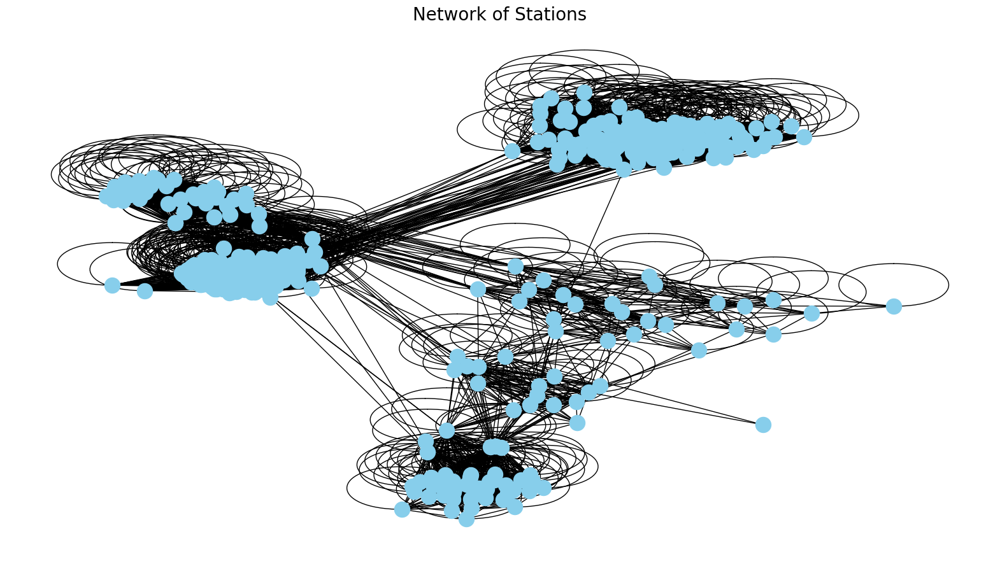

In [26]:
G = nx.from_pandas_edgelist(routes,source= 'origin', target='destination', edge_attr='num_trips', create_using=nx.Graph())

plt.figure(figsize=(20,11))
plt.title('Network of Stations', fontsize = 20)
plt.grid()
plt.axis('off')

#setting node color attribute

communities = cl.best_partition(G, random_state=42)
nx.set_node_attributes(G, communities, 'group') #group by community
node_degree = dict(G.degree)

#Setting up node size attribute
degree_dict = nx.degree_centrality(G) #size by degree centrality
nx.set_node_attributes(G, node_degree, 'size')

pos=nx.spring_layout(G)
nx.draw(G, with_labels=False, node_color='skyblue', edge_cmap=cm.Blues, pos=pos)
plt.show()

A more interactive and clear version of the network graph can be visualized with pyviz library.

In [27]:

#from pyvis.network import Network
#com_net = Network(notebook = True,
 #                 cdn_resources='remote',
#                width='1000px', 
 #                 height ='700px',
  #                bgcolor='#222222', 
   #               font_color='white')
#com_net.from_nx(G)
#com_net.show('routes.html')


![bikeshare network](https://www.googleapis.com/download/storage/v1/b/kaggle-forum-message-attachments/o/inbox%2F9434476%2F8eb809861bfcb6cb9f6ab39c28c08798%2FScreenshot%20(155).png?generation=1685580260873367&alt=media)

Note: this is not an interactive version

# Which of the station is the most important? 

## DEGREE CENTRALITY

The degree centrality is the number of neighbors of a node (in this case station) divided by all possible neighbors that it could have."Degree" of a node refers to the number of nodes that a given node is connected to.  Within the context of bikeshare, this refers to the number of bike stations that users have travelled to from the target station.

In [28]:
degree_df=nx.degree_centrality(G)
degree_df = pd.DataFrame.from_dict(degree_dict, orient='index', columns=['centrality'])
fig = px.bar(degree_df.sort_values('centrality', ascending=False)[0:9], title="Degree Centrality of Stations")
fig.update_layout(showlegend=False)

Cyril Magnin St at Ellie St has athe highest degree centrality. That is, it is the station with the most connection.

## BETWEENNESS CENTRALITY

The betweenness centrality captures how much a given node is "in-between" others. This measure calculates the shortest paths between all the nodes of the network and assigns each node a measure based on the number of shortest paths going through the target node. In the case of bike share stations, this shows the station that serve as a bridge from one part of network to another.

In [29]:
betweenness_dict = nx.betweenness_centrality(G)
betweenness_df = pd.DataFrame.from_dict(betweenness_dict, orient='index', columns=['centrality'])

fig = px.bar(betweenness_df.sort_values('centrality', ascending=False).head(10), title="Betweeness Centrality of Stations")
fig.update_layout(showlegend=False)

Cyril Magnin St at Ellis St has the highest betweeness centrality which shows that it was very instrumental in the turnover of bikes between stations in a given period of time. It connects different communities.

## CLOSENESS CENTRALITY

Closeness centrality measures the average distance to other nodes from a particular node.That is, closeness centrality is a way of detecting nodes that are able to distribute flows efficiently through the network. Within the context of the bikeshare, a node with high closeness centrality will indicate stations that can potentially act as versatile intermediary stations within the network.

In [30]:
closeness_dict = nx.closeness_centrality(G)
closeness_df = pd.DataFrame.from_dict(closeness_dict, orient='index', columns=['centrality'])

fig = px.bar(closeness_df.sort_values('centrality', ascending=False).head(10), title= "Closeness Centrality of Stations")
fig.update_layout(showlegend=False)


Cyril Magnin St at Ellis Station has the highest closeness centrality.

Cyril Magnin St at Ellis Station is the most important station across all measures of centrality. Recall that it was the most frequent `origin` and `destination` station earlier.

# BONUS: VISUAL REPRESENTATION OF COMMUNITIES OBTAINED USING LOUVAIN METHOD

In [31]:
community = pd.DataFrame.from_dict(communities, orient='index', columns=['community']).reset_index()
community.columns =['origin', 'community']
community.head()

,origin,community
0,Harry Bridges Plaza (Ferry Building),0
1,Embarcadero at Sansome,0
2,San Francisco Caltrain 2 (330 Townsend),0
3,Townsend at 7th,0
4,2nd at Townsend,0


In [32]:
merged_df = routes.merge(community, on='origin', how='left')
merged_df.head()

,origin_id,destination_id,origin,destination,olon,olat,dlon,dlat,num_trips,route,distance,community
0,50,60,Harry Bridges Plaza (Ferry Building),Embarcadero at Sansome,NaN,NaN,NaN,NaN,9150,Harry Bridges Plaza (Ferry Building)-Embarcade...,NaN,0
1,69,65,San Francisco Caltrain 2 (330 Townsend),Townsend at 7th,NaN,NaN,NaN,NaN,8508,San Francisco Caltrain 2 (330 Townsend)-Townse...,NaN,0
2,61,50,2nd at Townsend,Harry Bridges Plaza (Ferry Building),NaN,NaN,NaN,NaN,7620,2nd at Townsend-Harry Bridges Plaza (Ferry Bui...,NaN,0
3,50,61,Harry Bridges Plaza (Ferry Building),2nd at Townsend,NaN,NaN,NaN,NaN,6888,Harry Bridges Plaza (Ferry Building)-2nd at To...,NaN,0
4,60,74,Embarcadero at Sansome,Steuart at Market,NaN,NaN,NaN,NaN,6874,Embarcadero at Sansome-Steuart at Market,NaN,0


In [33]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27155 entries, 0 to 27154
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   origin_id       27155 non-null  int64  
 1   destination_id  27155 non-null  int64  
 2   origin          27155 non-null  object 
 3   destination     27155 non-null  object 
 4   olon            25016 non-null  float64
 5   olat            25016 non-null  float64
 6   dlon            25016 non-null  float64
 7   dlat            25016 non-null  float64
 8   num_trips       27155 non-null  int64  
 9   route           27155 non-null  object 
 10  distance        25016 non-null  float64
 11  community       27155 non-null  int64  
dtypes: float64(5), int64(4), object(3)
memory usage: 2.7+ MB


Let's change the data type of community to object.

In [34]:
merged_df['community'] = merged_df.community.astype('object')
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27155 entries, 0 to 27154
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   origin_id       27155 non-null  int64  
 1   destination_id  27155 non-null  int64  
 2   origin          27155 non-null  object 
 3   destination     27155 non-null  object 
 4   olon            25016 non-null  float64
 5   olat            25016 non-null  float64
 6   dlon            25016 non-null  float64
 7   dlat            25016 non-null  float64
 8   num_trips       27155 non-null  int64  
 9   route           27155 non-null  object 
 10  distance        25016 non-null  float64
 11  community       27155 non-null  object 
dtypes: float64(5), int64(3), object(4)
memory usage: 2.7+ MB


In [35]:
color_map = {0: "blue", 1: "yellow",2:"red" ,3:"lightgreen"}
fig = px.scatter_mapbox(merged_df,lat='olat', lon='olon', zoom=9,
                        mapbox_style="carto-positron", height=700,
                        hover_name='origin', size='num_trips', 
                        color='community',
                        color_discrete_map = color_map ,
                       title="Map of Bikeshare Station in SanFrancisco",opacity=0.5)
fig.update_layout(scattergap=0)
fig.show()

The stations in South Francisco have higher number of trips than those in Oakland. The stations in San Jose has the least number of trips.

The commnity was able to accurately recognize that there are three cluster of stations with only information  on the network relationship and community. 
But it seems there is a problem: community 2 can not be found on the map.


In [36]:
import plotly.graph_objects as go
import pandas as pd

# Read the dataframe with source and destination coordinates
df = merged_df  # Replace 'your_dataframe.csv' with the actual path to your dataframe

# Create an empty list to store the route traces
traces = []

# Iterate over each row in the dataframe
for index, row in df.iterrows():
    source_lat = row['olat']
    source_lon = row['olon']
    dest_lat = row['dlat']
    dest_lon = row['dlon']

    # Create a trace for the route between source and destination coordinates
    trace = go.Scattermapbox(
        mode='lines',
        lon=[source_lon, dest_lon],
        lat=[source_lat, dest_lat],
        line=dict(width=2, color='blue'),
        hoverinfo='none'
    )

    # Append the trace to the list of traces
    traces.append(trace)

# Create the layout for the map
layout = go.Layout(
    mapbox=dict(
        center=dict(
            lat=37.77,
            lon=122.42
        ),
        style="carto-positron",
        zoom=10
    ),
    margin=dict(l=0, r=0, t=0, b=0),
    showlegend=False
)

# Create the figure with the traces and layout
fig = go.Figure(data=traces, layout=layout)

# Display the figure
fig.show()


In [37]:
zero_community = merged_df.query('community == 2')
zero_community[['olat','olon','dlon','dlat']].isna().sum()/zero_community.shape[0]

olat    0.308769
olon    0.308769
dlon    0.308769
dlat    0.308769
dtype: float64

100%  of the geospatial columns are missing in community 2.

<div style='color: #33332a;
           background-color: #FFFCC7;
           font-size: 200%;
           border-radius:15px;
           text-align:center;
           font-weight:600;
           border-style: solid;
           border-color: #33332a;
           font-family: "Cambria";'>
SUMMARY OF FINDINGS
<a class="anchor" id="1"></a> 

# KEY FINDINGS
1. **Which region has the highest number of stations and available bikes?** Region 3.

Region 3 also has the highest number of stations and bikes.

2. **What is the distribution of trips per bike?** The number of trips per bike are skewed to low values.

There is a significant amount of bikes that have taken trips greter than 2000. Only a few bikes have been riden more than 1000 time with trips per bike having a nigh zero count between 1000 and 15000. 

3. **What is the trend of trips?** The number of trips follow a general upward trend.

The number of trips increased between 2013 and 2014. The rate of increased slowed down betweeen 2014 and 2015 before a decline in 2016. In 2017, the number of trips peaked  before declining again in 2018.

4. **What is  the Station with the most number of trips?** The Sanfrancisco Caltrain stations.

5. **What is the spatial distribution of stations?** There are three major cluster of stations.

There are two clusters at the opposing ends of the San-Francisco - Oakland Bay bridge and another in San Jose. The San-Francisco cluster have the most number of trips and stations, followed by Oakland cluster with the San Jise stations having the least trips and stations. This is because the bikes are used by most customer as a means of crossing the bridge.

6. **What is the general distance preference by San Francisco Bikeshare Cyclists?** Most cyclists prefer short trips to long trips.

More generally the bikes are either used for very short trips or very long trips. Only 5 trips have been taken along the long-route.

7. **Which station has the most importance?** Cyril Magnin St at Ellie St as it has the highest betweeness, closeness and degree centrality.

This station appears in the most number of routes, serves as intermediary between routes and also has the shortest path between route (in the sense that, the route has the most indirect number of connections in few steps).

8. **Accuracy of the Louvain Community Detection Method** The louvain method was able to accurately predict that the stations were divided into 3 clusters using only information abour=t network relationship.

9. There is no relationship between number of trips and distance across the various cluster of stations.

<div style='color: #33332a;
           background-color: #FFFCC7;
           font-size: 200%;
           border-radius:15px;
           text-align:center;
           font-weight:600;
           border-style: solid;
           border-color: #33332a;
           font-family: "Cambria";'>
NEXT STEPS
<a class="anchor" id="1"></a> 

For an introduction to network analysis as a whole, check:

Quantecon Data Science. (2022). [Social and Economic Network](https://datascience.quantecon.org/applications/networks.html)

Treton Mckinney. (2020). [Introduction to Network Analytics in Python](https://trenton3983.github.io/files/projects/2020-05-21_intro_to_network_analysis_in_python/2020-05-21_intro_to_network_analysis_in_python.html)

For an example of network analysis for Nlp problem check:

Thu-Vu Data Analytics. (2022). [Network of Witcher](https://www.youtube.com/watch?v=fAHkJ_Dhr50): Relationship Extraction and Network Analytics.



<div style='color: #33332a;
           background-color: #FFFCC7;
           font-size: 200%;
           border-radius:15px;
           text-align:center;
           font-weight:600;
           border-style: solid;
           border-color: #33332a;
           font-family: "Cambria";'>
CONCLUSION
<a class="anchor" id="1"></a> 

There was some hurdles I faced in this project. The most important station was among the stations with missing latitude and longitude data this prevented me from visualizing the location fo the most important stations. You can improve on this project by visualizing the network using a software like Tableau that generate longitude and latitude for geographical features.

That's all for now. I hope you found this notebook helpful. Be sure to leave a comment if you have any contribution, correction or question to ask. Also remember to leave an upvote if you found this notebook helpful.